In [24]:
import os
import configparser
import multiprocessing as mp
from datetime import datetime
import glob

from src.data_formatting_and_upload import data_formatting
from src.image_preprocessing_module import image_preprocessing
from src.quality_assessment_and_quality_control import qa_qc
from src_knmi.table_and_cell_detection_model_knmi import table_and_cell_detection
from src.transcription import transcription
from src.validation import validate

In [25]:
# Module 1: Configuration
# Load settings from user configurations. See configuration.ini file in this repository
config = configparser.ConfigParser()
# Adjust path to config.ini (since it's placed in the root directory)
# config_file_path = os.path.join(os.path.dirname(
    # os.path.dirname(__file__)), 'configuration.ini')
config.read('configs/base.ini')

# Get run_mode and number of processors from configuration file
run_mode = config['General']['run_mode']
num_processors = int(config['General'].get('num_processors', 1))

# Set up directories from the configuration file
full_datadir = config['Directories']['full_datadir'] # Directory to all the images/scans of the hydroclimatic data sheets
pre_QA_QC_transcribed_hydroclimate_data_dir = config['Directories']['pre_QA_QC_transcribed_hydroclimate_data_dir'] # Directory where pre-QA/QC transcribed data is stored
post_QA_QC_transcribed_hydroclimate_data_dir = config['Directories']['post_QA_QC_transcribed_hydroclimate_data_dir'] # Directory where post-QA/QC transcribed data is stored
final_refined_daily_hydroclimate_data_dir = config['Directories']['final_refined_daily_hydroclimate_data_dir'] # Directory for the final refined daily hydroclimate data (after all quality checks)
manually_transcribed_data_dir = config['Directories']['manually_transcribed_data_dir'] # Directory for manually transcribed data (used for validation)
validation_dir = config['Directories']['validation_dir'] # Directory for validation results comparing manually transcribed and the MeteoSaver transcribed data 
transient_transcription_output_dir = config['Directories']['transient_transcription_output_dir'] # Directory to store transient transcription output during processing
metadata_file_path = config['Directories']['metadata_file_path'] # Directory for all the stations metadata

# Get all folder names (Station Numbers) within full_datadir
all_stations = [folder for folder in os.listdir(full_datadir) 
                if os.path.isdir(os.path.join(full_datadir, folder))]

min_cell_width_threshold = int(config['TableAndCellDetection']['min_cell_width_threshold']) # Minimum cell width threshold for table and cell detection
max_cell_width_threshold = int(config['TableAndCellDetection']['max_cell_width_threshold']) # Maximum cell width threshold for table and cell detection
min_cell_height_threshold = int(config['TableAndCellDetection']['min_cell_height_threshold']) # Minimum cell height threshold for table and cell detection
max_cell_height_threshold = int(config['TableAndCellDetection']['max_cell_height_threshold']) # Maximum cell height threshold for



In [26]:
print(min_cell_width_threshold, max_cell_width_threshold, min_cell_height_threshold, max_cell_height_threshold)

60 140 30 50


In [27]:
import cv2
import matplotlib.pyplot as plt
# from src.table_and_cell_detection_model import deskew
import numpy as np
from cv2.typing import MatLike

def deskew(image: MatLike):
    """Rotate the image to correct skew. Using OpenCV's findContours to find the largest 
    contour, take the minimum area rectangle, and then rotate the image to correct the skew.

    Parameters
    ----------
    image
        _description_

    Returns
    -------
        _description_
    """    
    gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)

    # Load the image
    blurred = cv2.GaussianBlur(gray, (3, 3), 0)

    # Edge detection
    edges = cv2.Canny(blurred, 50, 150, apertureSize=3)

    # Find contours
    contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)

    for contour in contours:
    # # Assume the largest contour is the table
    # table_contour = contours[1]

        # Find the minimum area rectangle
        rect = cv2.minAreaRect(contour)
        angle = rect[-1]
        print(angle)
        if angle > 10 or angle < -10:
            # Rotate the image  
            if angle < -87:
                angle += 90
                break
            elif angle > 87:
                angle -= 90
                break
            print(f"Angle {angle:.2f} too large, trying next contour")
            continue
        break

    # Rotate the image  
    # if angle < -45:
    #     angle += 90
    # elif angle > 45:
    #     angle -= 90
    print(f"Rotating image by {angle:.2f} degrees")

    (h, w) = image.shape[:2]
    center = (w // 2, h // 2)
    M = cv2.getRotationMatrix2D(center, angle, 1.0)
    rotated = cv2.warpAffine(image, M, (w, h), flags=cv2.INTER_CUBIC, borderMode=cv2.BORDER_TRANSPARENT)
    return rotated, M

def read_img(image_path: str) -> MatLike:
    # Read the image
    image = cv2.imread(image_path)
    # Convert to RGB
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    return image

def image_preprocessing(image: MatLike, cutoff_hsv=100, skew=True, blur=False, blocksize=51, C=6):
    """Get grayscale and binarized image, optionally rotated to correct skew.

    Parameters
    ----------
    image
        binarized or grayscale image
    cutoff_hsv, optional
        by default 100
    skew, optional
        by default True

    Returns
    -------
        grayscale image, binarized image, original image
    """    
    ## Read Image from the given image path
    original_image  = image
    if skew:
        original_image, rotation_matrix = deskew(original_image)
    # Convert image to grayscale
    if blur:
        original_image = cv2.GaussianBlur(original_image, (3, 3), 0)
    image_in_grayscale = cv2.cvtColor(original_image, cv2.COLOR_RGB2GRAY)
    
    # Convert to HSV color space
    hsv = cv2.cvtColor(original_image, cv2.COLOR_RGB2HSV)

    # Define a range of HSV values to mask the paper
    # These values need to be adjusted based on your specific image
    lower_hsv = np.array([0, 0, 0])
    upper_hsv = np.array([cutoff_hsv, cutoff_hsv, cutoff_hsv])

    # Create a mask using the HSV range
    mask = cv2.inRange(hsv, lower_hsv, upper_hsv)
    binarized_image = cv2.bitwise_not(mask)

    image_in_grayscale = cv2.cvtColor(original_image, cv2.COLOR_RGB2GRAY)
    # binarized_image = cv2.adaptiveThreshold(image_in_grayscale,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
    #         cv2.THRESH_BINARY,201,2)
    # _, binarized_image = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU)
    blur = cv2.GaussianBlur(image_in_grayscale,(5,5),0)
    # _, binarized_image = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
    binarized_image = cv2.adaptiveThreshold(blur,255,cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
            cv2.THRESH_BINARY,blockSize=blocksize,C=C)

    # C: subtraction that gets rid of some noise
    # blockSize: size of the neighborhood area used to calculate the threshold value
    return image_in_grayscale, binarized_image, original_image


Possibly use a different preprocessing to find the word Datum as the printed text can get blurry from the settings for Meteosaver.

In [28]:
file_path = 'data/00_knmi_images/testset/curacao_1941_0116.jpg'
conf_file = file_path.replace('.jpg', '.ini')
config.read(conf_file)
img = read_img(file_path)

blocksize = config.getint('Table_detection', 'blocksize')
C = config.getint('Table_detection', 'C')
table_width = config.getint('Table_detection', 'w')
table_height = config.getint('Table_detection', 'h')
table_x_offset = config.getint('Table_detection', 'x')
table_y_offset = config.getint('Table_detection', 'y')
reference_word = config['Table_detection']['reference']
image_in_grayscale, binarized_image, original_image = image_preprocessing(img, blocksize=blocksize, C=C, skew=True)
# cv2.namedWindow('custom window', cv2.WINDOW_KEEPRATIO)
# cv2.imshow('custom window', binarized_image )
# cv2.resizeWindow('custom window', 1080, 920)
# cv2.waitKey()
# cv2.destroyAllWindows()

0.6354169845581055
Rotating image by 0.64 degrees


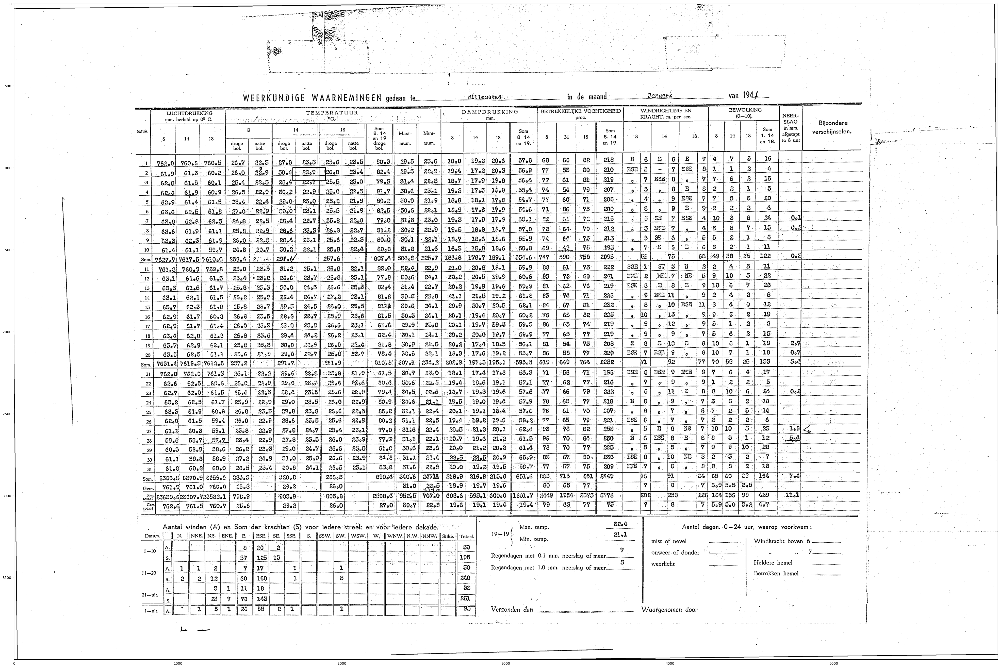

In [29]:
config.read(conf_file)
min_cell_width_threshold = config.getint('Cell_detection', 'min_cell_width')
max_cell_width_threshold = config.getint('Cell_detection', 'max_cell_width')
min_cell_height_threshold = config.getint('Cell_detection', 'min_cell_height')
max_cell_height_threshold = config.getint('Cell_detection', 'max_cell_height')

x = 1500
y = 1000
w = min_cell_width_threshold
h = min_cell_height_threshold
min_cell = cv2.rectangle(binarized_image, (x, y), (x + w, y + h), (0, 0, 255), 3)

x = 1700
y = 1000
w = max_cell_width_threshold
h = max_cell_height_threshold
max_cell = cv2.rectangle(binarized_image, (x, y), (x + w, y + h), (0, 255, 0), 3)
plt.figure(figsize=(50, 50))
plt.imshow(min_cell, cmap='gray')
plt.axis('on')  # Hide axis
plt.show()

In [30]:
import logging
import pytesseract
import pandas as pd
import re

logger = logging.getLogger('meteosaver')

def find_word(image: np.ndarray, reference_word: str = "DATUM", hor_offset: int=3000, vert_offset: int=1000):
    """
    Return x, y of reference word "DATUM" in image
    """    
    word = reference_word
    cropped = image[vert_offset:vert_offset+1000, hor_offset:hor_offset+1000]
    # cv2.namedWindow('custom window', cv2.WINDOW_KEEPRATIO)
    # cv2.imshow('custom window', cropped )
    # cv2.resizeWindow('custom window', 1080, 920)
    # cv2.waitKey()
    # cv2.destroyAllWindows()
    # plt.imshow(cropped, cmap='gray')
    data = pytesseract.image_to_data(cropped, lang='nld', 
                                     output_type=pytesseract.Output.DICT)

    # Convert the data to a DataFrame for easier manipulation
    df = pd.DataFrame(data)
    x = None
    # Find the word and get its coordinates
    for i in range(len(df['text'])):
        if re.sub('[^a-zA-Z]+', '', str(df['text'][i]).lower().strip('."')) == word.lower():
            (x, y) = (df['left'][i]+hor_offset, df['top'][i]+vert_offset)
            print(f"The word '{word}' was found at coordinates: "\
                  f"(x={x}, y={y})")
    if x is not None:
        return x, y, df
    else:
        return None, None, df
    
def table_detection(binarized_image: np.ndarray, reference_word: str = "datum", size: tuple = (3663, 2601), 
                    initial_offset: tuple =(3000, 1000), table_offset: tuple = (150, 170)):
    """Returns the coordinates of the table in the image by finding the 
    word "DATUM" in the image and using default values for the table 
    width and height.

    Parameters
    ----------
    binarized_image
        
    Returns
    -------
        (x, y, w, h): Coordinates of top left corner of the table and 
        its width and height
    """    
    (x, y, df) = find_word(binarized_image, reference_word, initial_offset[0], initial_offset[1])

    if x is None or y is None:
        logger.error("No table detected. Returning detected text.")
        return None, None, None, None, df
    w = size[0]
    h = size[1]
    x, y = (x+table_offset[0], y+table_offset[1])

    return (x, y, w, h, df)

In [31]:
# file_path = './data/00_knmi_images/072/st-eustatius_1911_0002.jpg'
# img = read_img(file_path)
# image_in_grayscale, binarized_image, original_image = image_preprocessing(img, blocksize=51)

# # plt.imshow(binarized_image,cmap='gray')

# cv2.namedWindow('custom window', cv2.WINDOW_KEEPRATIO)
# cv2.imshow('custom window', binarized_image[100:, 500:] )
# cv2.resizeWindow('custom window', 1080, 920)
# cv2.waitKey()
# cv2.destroyAllWindows()
# image_in_grayscale, binarized_image, original_image = image_preprocessing(img, blocksize=blocksize, C=C)
config.read(conf_file)
blocksize = config.getint('Table_detection', 'blocksize')
C = config.getint('Table_detection', 'C')
table_width = config.getint('Table_detection', 'w')
table_height = config.getint('Table_detection', 'h')
table_x_offset = config.getint('Table_detection', 'x')
table_y_offset = config.getint('Table_detection', 'y')
reference_word = config['Table_detection']['reference']

image_in_grayscale, binarized_image, original_image = image_preprocessing(img, blocksize=blocksize, C=C, skew=True)

size = (table_width, table_height)
table_offset=(table_x_offset, table_y_offset)
initial_offset=(100, 500)
reference_word=reference_word
x, y, w, h, df = table_detection(binarized_image, reference_word=reference_word, size=size, 
                                 initial_offset=initial_offset, table_offset=table_offset)

if x is not None:
    table_original_image = original_image[y:y + h, x:x + w]
    image_in_grayscale, binarized_image, original_image = image_preprocessing(table_original_image, cutoff_hsv=125, skew=False, blur=True, blocksize=15, C=3)
    
    table_img_bin = binarized_image
    table_original_image = original_image
    full_detected_table_with_labels = binarized_image
    cv2.namedWindow('custom window', cv2.WINDOW_KEEPRATIO)
    cv2.imshow('custom window', table_img_bin)
    cv2.resizeWindow('custom window', 1080, 720)
    cv2.waitKey()
    cv2.destroyAllWindows()
else:
    df.head()

# plt.imshow(table_img_bin, cmap='gray')


# cv2.imwrite('st-eustatius_1911_0002_binarized.jpg', table_img_bin)
# cv2.imwrite('st-eustatius_1911_0002_original.jpg', table_original_image)
# cv2.imwrite('st-eustatius_1911_0002_grayscale.jpg', image_in_grayscale)

0.6354169845581055
Rotating image by 0.64 degrees
The word 'datum' was found at coordinates: (x=750, y=773)


In [32]:
df

,level,page_num,block_num,par_num,line_num,word_num,left,top,width,height,conf,text
0,1,1,0,0,0,0,0,0,1000,1000,-1,
1,2,1,1,0,0,0,194,681,14,18,-1,
2,3,1,1,1,0,0,194,681,14,18,-1,
3,4,1,1,1,1,0,194,681,14,18,-1,
4,5,1,1,1,1,1,194,681,14,18,14,7
5,2,1,2,0,0,0,640,134,171,9,-1,
6,3,1,2,1,0,0,640,134,171,9,-1,
7,4,1,2,1,1,0,640,134,171,9,-1,
8,5,1,2,1,1,1,640,134,171,9,44,me
9,2,1,3,0,0,0,831,158,169,23,-1,


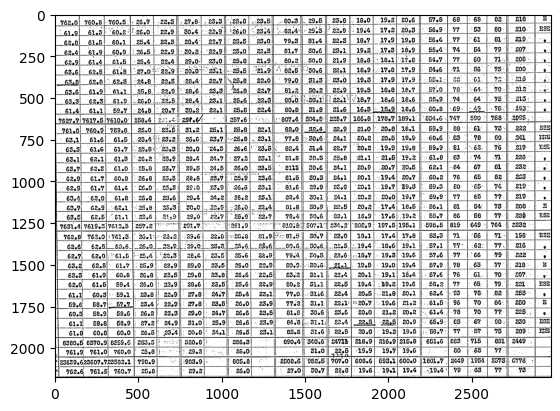

In [33]:
station = '072'

plt.imshow(table_img_bin, cmap='gray')
# cv2.namedWindow('custom window', cv2.WINDOW_KEEPRATIO)
# cv2.imshow('custom window', binarized_image )
# cv2.resizeWindow('custom window', 1080, 920)
# cv2.waitKey()
# cv2.destroyAllWindows()

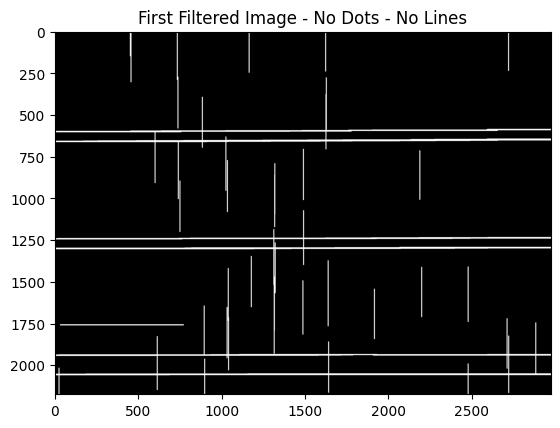

In [34]:
from src.table_and_cell_detection_model import remove_vertical_lines
table_img_bin = remove_vertical_lines(binarized_image)

# Save the binary image for use later in detecting text
save_dir = os.path.join(transient_transcription_output_dir, station)
os.makedirs(save_dir, exist_ok=True)  # Ensure the directory exists
save_path = os.path.join(save_dir, 'table_binarized.jpg')
cv2.imwrite(save_path, table_img_bin)

# Invert the binarized image of the table
img_bin = 255-table_img_bin
# Detect the vertical lines in the image
vertical_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, np.array(table_img_bin).shape[1]//50)) # The '//50' divides the length of the array (table) by 50, likely to obtain a fraction of the length for the structuring element,
eroded_image = cv2.erode(img_bin, vertical_kernel, iterations=1)
vertical_lines = cv2.dilate(eroded_image, vertical_kernel, iterations=5)
# Detect the horizontal lines in the image
hor_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (np.array(table_img_bin).shape[1]//20, 1)) # The '//20' divides the width of the array (table) by 20, likely to obtain a fraction of the width for the structuring element.
eroded_image= cv2.erode(img_bin, hor_kernel, iterations=1)
horizontal_lines = cv2.dilate(eroded_image, hor_kernel, iterations=5)
# Blending the imaegs with the vertical lines and the horizontal lines 
combined_vertical_and_horizontal_lines = cv2.addWeighted(vertical_lines, 1, horizontal_lines, 1, 1)
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (2, 2))
combined_image_dilated = cv2.dilate(combined_vertical_and_horizontal_lines, kernel, iterations=5)
# Remove the lines from the image (table)
image_without_lines = cv2.subtract(img_bin, combined_image_dilated)
# Remove smaller 'still-visible' lines through noise removal
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
image_without_lines_noise_removed = cv2.erode(image_without_lines, kernel, iterations=1)
image_without_lines_noise_removed = cv2.dilate(image_without_lines_noise_removed, kernel, iterations=1)


plt.imshow(combined_image_dilated, cmap="gray")
plt.title("First Filtered Image - No Dots - No Lines")
plt.show()

100%|██████████| 17775/17775 [01:31<00:00, 195.04it/s]


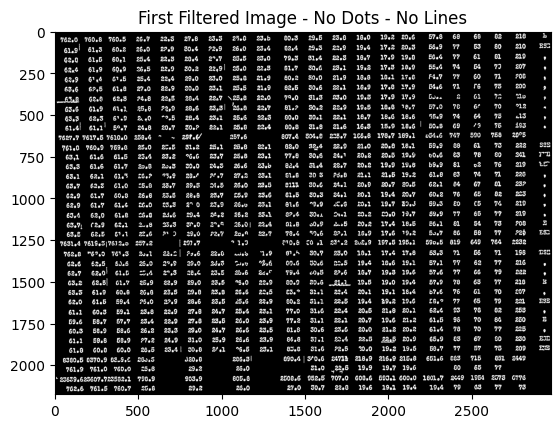

In [35]:
from tqdm.auto import tqdm
# Step 1: Detect all connected components
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(image_without_lines_noise_removed, connectivity=8)

# Create a mask to keep only valid text components
filtered_image = np.zeros_like(image_without_lines_noise_removed)

# Set thresholds
ASPECT_RATIO_THRESHOLD = 4  # If Width / Height > 4 (was 4 before this new check), it's considered horizontal noise
HEIGHT_THRESHOLD = 5  # Remove any blobs with height less than this
PROXIMITY_THRESHOLD = 5  # Maximum distance (in pixels) to consider a dot "close" to a number

# Store y-coordinates and x-limits of horizontal dots **ONLY NEAR TEXT**
horizontal_lines = []

logger.debug('Step 2: Identify large text components (potential numbers)')
text_components = []
dots_to_remove = np.zeros_like(labels)  # Mask for dots to be removed

for i in tqdm(range(1, num_labels)):
    x, y, w, h, area = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT], stats[i, cv2.CC_STAT_AREA]

    aspect_ratio = w / h  # Compute aspect ratio

    # Keep only real text (numbers) as reference components
    if area > 100 and aspect_ratio < ASPECT_RATIO_THRESHOLD and h > HEIGHT_THRESHOLD:   # was 100 before this check, then i tried 50
        text_components.append((x, y, w, h))
        filtered_image[labels == i] = 255  # Keep text
    
    else:
        dots_to_remove[labels == i] = 255  # Mark dots for removal

plt.imshow(filtered_image, cmap="gray")
plt.title("First Filtered Image - No Dots - No Lines")
plt.show()

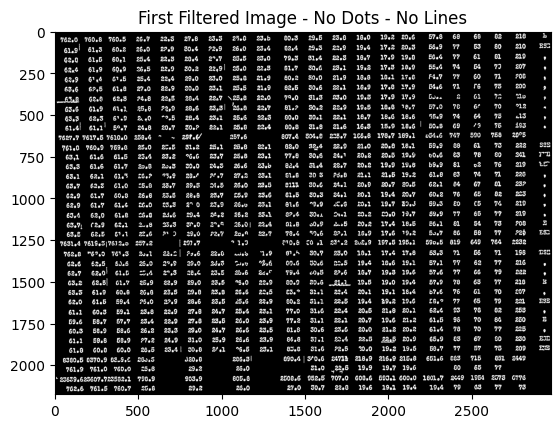

In [46]:
# Step 1: Detect all connected components
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(image_without_lines_noise_removed, connectivity=8)

# Create a mask to keep only valid text components
filtered_image = np.zeros_like(image_without_lines_noise_removed)

# Set thresholds
ASPECT_RATIO_THRESHOLD = 4
HEIGHT_THRESHOLD = 5
PROXIMITY_THRESHOLD = 5

horizontal_lines = []

logger.debug('Step 2: Identify large text components - OPTIMIZED')

# Pre-compute aspect ratios for all components
if num_labels > 1:
    widths = stats[1:, cv2.CC_STAT_WIDTH]
    heights = stats[1:, cv2.CC_STAT_HEIGHT]
    areas = stats[1:, cv2.CC_STAT_AREA]
    aspect_ratios = widths / heights
    
    text_components = []
    text_labels_to_keep = []
    dot_labels_to_remove = []
    
    # Single loop with pre-computed values
    for i in range(num_labels - 1):  # Exclude background
        label_id = i + 1
        area = areas[i]
        aspect_ratio = aspect_ratios[i]
        height = heights[i]
        
        # Keep only real text (numbers) as reference components
        if area > 100 and aspect_ratio < ASPECT_RATIO_THRESHOLD and height > HEIGHT_THRESHOLD:
            x, y, w, h = stats[label_id, cv2.CC_STAT_LEFT:cv2.CC_STAT_LEFT+4]
            text_components.append((x, y, w, h))
            text_labels_to_keep.append(label_id)
        else:
            dot_labels_to_remove.append(label_id)
    
    # Batch update images
    if text_labels_to_keep:
        text_mask = np.isin(labels, text_labels_to_keep)
        filtered_image[text_mask] = 255
    
    dots_to_remove = np.zeros_like(labels)
    if dot_labels_to_remove:
        dot_mask = np.isin(labels, dot_labels_to_remove)
        dots_to_remove[dot_mask] = 255
else:
    text_components = []
    dots_to_remove = np.zeros_like(labels)

plt.imshow(filtered_image, cmap="gray")
plt.title("First Filtered Image - No Dots - No Lines")
plt.show()

In [44]:
# Pre-convert text_components to numpy arrays for faster operations
if text_components:
    text_array = np.array(text_components)  # Shape: (N, 4) for N text components
    
    for i in tqdm(range(1, num_labels)):
        x, y, w, h, area = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT], stats[i, cv2.CC_STAT_AREA]
        aspect_ratio = w / h
        # Skip already kept text components
        if area > 100 and aspect_ratio < ASPECT_RATIO_THRESHOLD and h > HEIGHT_THRESHOLD:
            continue
        
        # Vectorized proximity check
        dot_center_x, dot_center_y = x + w // 2, y + h // 2
        
        # Check proximity to all text components at once
        in_x_range = ((text_array[:, 0] - PROXIMITY_THRESHOLD <= dot_center_x) & 
                      (dot_center_x <= text_array[:, 0] + text_array[:, 2] + PROXIMITY_THRESHOLD))
        in_y_range = ((text_array[:, 1] - PROXIMITY_THRESHOLD <= dot_center_y) & 
                      (dot_center_y <= text_array[:, 1] + text_array[:, 3] + PROXIMITY_THRESHOLD))
        
        keep_dot = np.any(in_x_range & in_y_range)
        
        if keep_dot:
            filtered_image[labels == i] = 255
            horizontal_lines.append((dot_center_y, x, x + w))

100%|██████████| 751/751 [00:03<00:00, 218.70it/s]


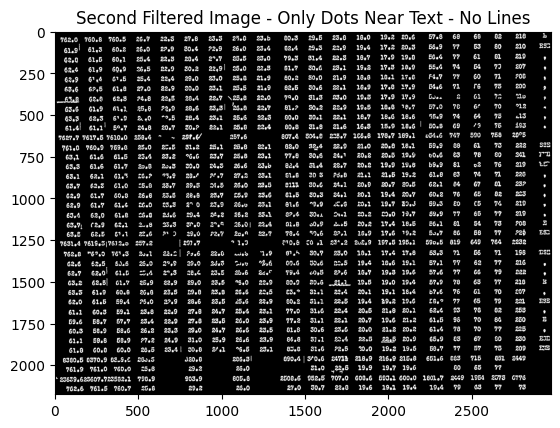

In [47]:
plt.imshow(filtered_image, cmap="gray")
plt.title("Second Filtered Image - Only Dots Near Text - No Lines")
plt.show()

  0%|          | 1/17775 [00:00<1:54:18,  2.59it/s]

100%|██████████| 17775/17775 [02:46<00:00, 106.60it/s]


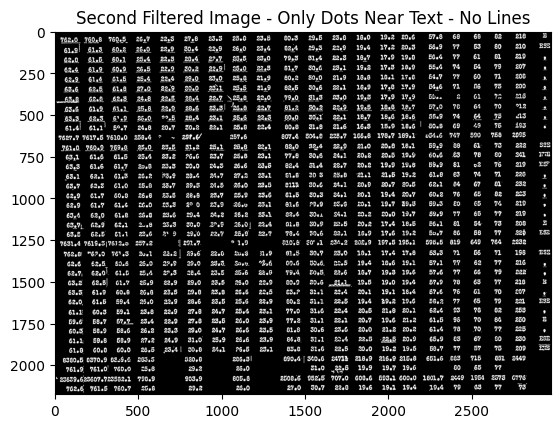

In [48]:
logger.debug('Step 3: Process small dots and keep only those near text')
for i in tqdm(range(1, num_labels)):
    x, y, w, h, area = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT], stats[i, cv2.CC_STAT_AREA]

    # Skip already kept text components
    if area > 100 and aspect_ratio < ASPECT_RATIO_THRESHOLD and h > HEIGHT_THRESHOLD:
        continue  # Skip large text components

    # Check if this small dot is close to any number
    keep_dot = False
    for tx, ty, tw, th in text_components:
        # Compute distance from dot center to the number bounding box
        dot_center_x, dot_center_y = x + w // 2, y + h // 2
        if (tx - PROXIMITY_THRESHOLD <= dot_center_x <= tx + tw + PROXIMITY_THRESHOLD and
            ty - PROXIMITY_THRESHOLD <= dot_center_y <= ty + th + PROXIMITY_THRESHOLD):
            keep_dot = True
            # Store the y-position and x-limits of dots near text
            horizontal_lines.append((dot_center_y, x, x + w))  # (y-position, x_start, x_end)
            break  # No need to check other numbers

    if keep_dot:
        filtered_image[labels == i] = 255  # Keep dots near numbers
    # else:
    #     dots_to_remove[labels == i] = 255  # Mark dots for removal

plt.imshow(filtered_image, cmap="gray")
plt.title("Second Filtered Image - Only Dots Near Text - No Lines")
plt.show()

In [37]:
max_cell_height_threshold

80

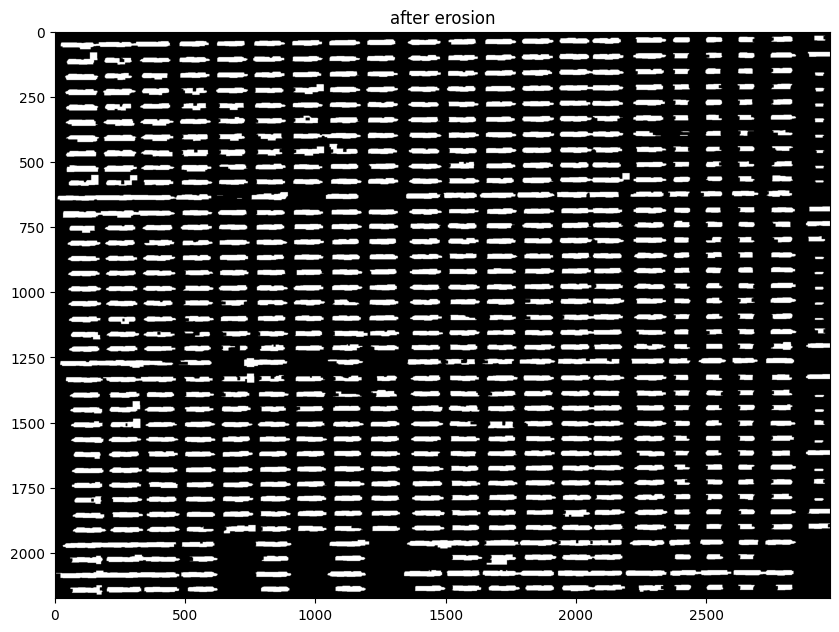

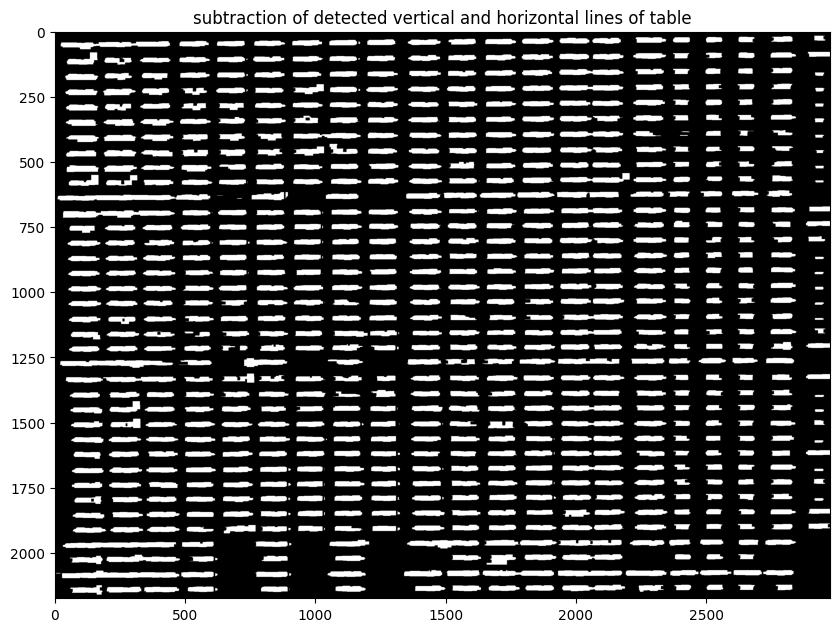

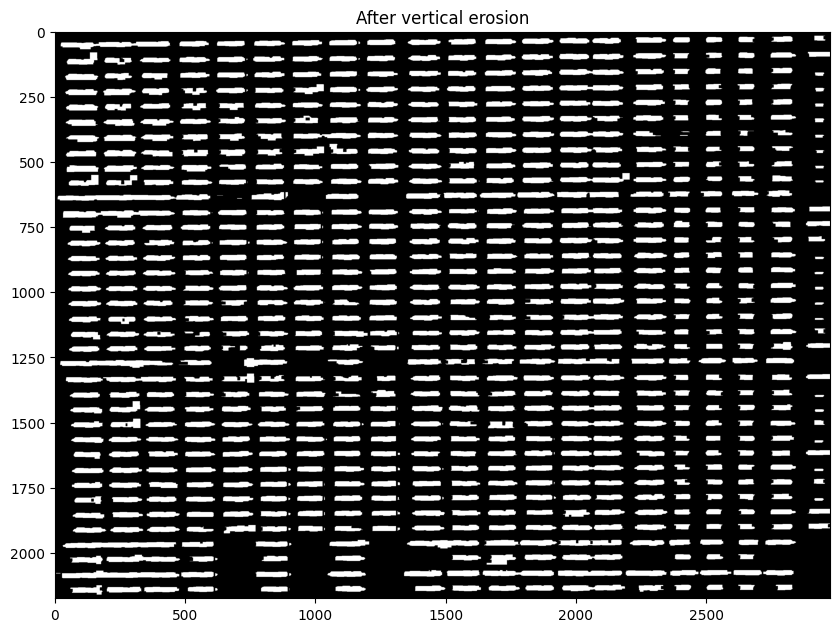

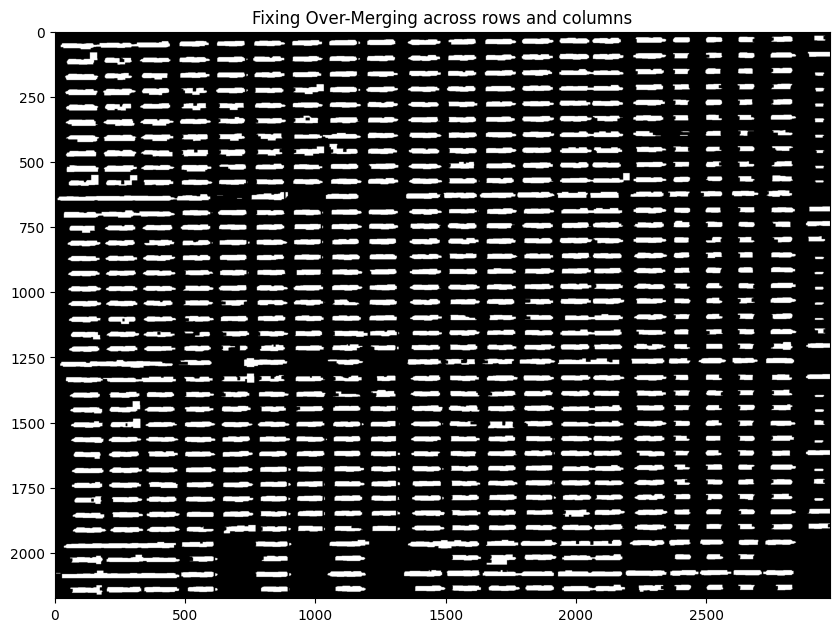

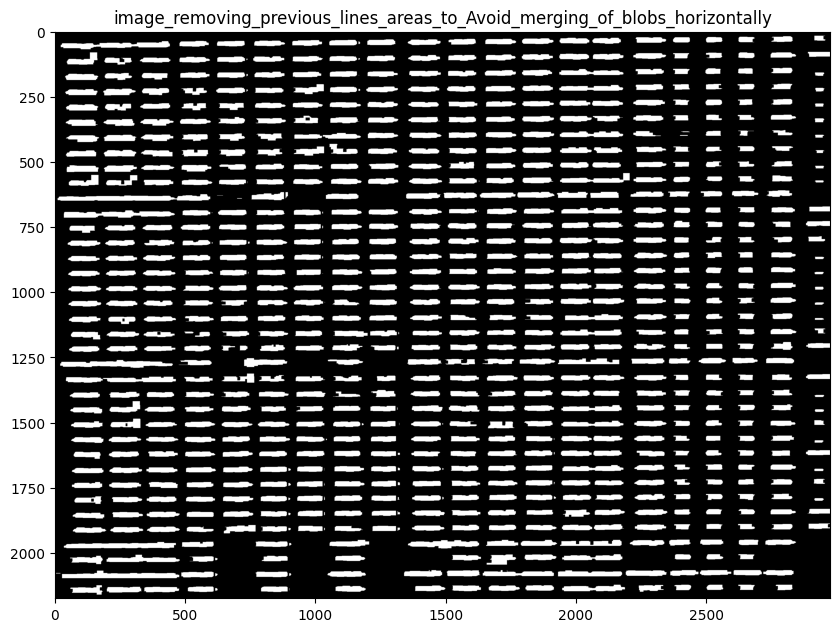

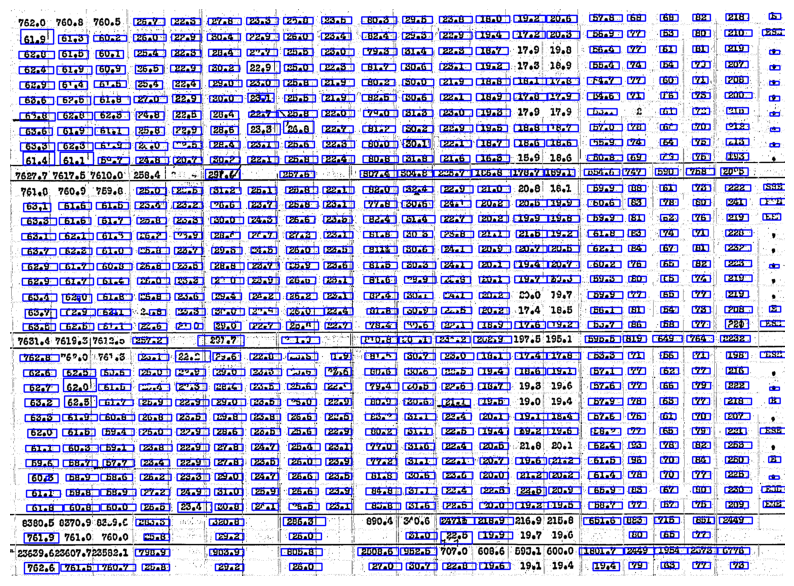

In [45]:
plot = True
figsize = (10,10)

# config.read('configuration.ini')
# min_cell_width_threshold = int(config['TableAndCellDetection']['min_cell_width_threshold']) # Minimum cell width threshold for table and cell detection
# max_cell_width_threshold = int(config['TableAndCellDetection']['max_cell_width_threshold']) # Maximum cell width threshold for table and cell detection
# min_cell_height_threshold = int(config['TableAndCellDetection']['min_cell_height_threshold']) # Minimum cell height threshold for table and cell detection
# max_cell_height_threshold = int(config['TableAndCellDetection']['max_cell_height_threshold']) # Maximum cell height threshold for

# max_cell_width_threshold = 300
# max_cell_height_threshold = 65


# Step 2: Use **horizontal dilation** to merge digits within numbers, but prevent full merging
kernel_to_remove_gaps = np.ones((1, 6), np.uint8)  # Horizontal merging kernel
image_with_number_blobs = cv2.dilate(filtered_image, kernel_to_remove_gaps, iterations=5)  # Controlled dilation



# Step 3: Apply **morphological closing** to ensure numbers remain compact blobs
rect_kernel = np.ones((1, 3), np.uint8)   # was 3 initially. in prev step was 1
image_with_word_blobs = cv2.morphologyEx(image_with_number_blobs, cv2.MORPH_CLOSE, rect_kernel, iterations=3)


# Define a horizontal erosion kernel
horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 6))  # (height, width) to break horizontal merges. had it at 1,5 initially 
# Apply erosion to break the connection between digits
image_with_word_blobs = cv2.erode(image_with_word_blobs, horizontal_kernel, iterations=2)  # Increase iterations if still connected. Had 2 iteratons initially

if plot:
    plt.figure(figsize=figsize)
    plt.imshow(image_with_word_blobs, cmap = 'gray') # figure showing detected table image with horizintal and vertical lines removed.
    plt.title('after erosion')
    plt.show()

# ** delete small horizontal lines.
# Create a blank mask for horizontal lines
# horizontal_line_mask = np.zeros_like(image_with_word_blobs)


# Draw **thin** horizontal lines at detected y-positions (but not subtracting yet)
# for y, x_start, x_end in horizontal_lines:
#     cv2.line(horizontal_line_mask, (x_start - 15, y), (x_end + 15, y), 255, thickness=3)  # Initially very thin

# **Step 3: Subtract the dilated lines from the filtered image**
# image_with_word_blobs = cv2.subtract(image_with_word_blobs, horizontal_line_mask)




# Subtract the detected vertical and horizontal lines from the filtered image**
image_with_word_blobs = cv2.subtract(image_with_word_blobs, combined_image_dilated)

if plot:
    plt.figure(figsize=figsize)
    plt.imshow(image_with_word_blobs, cmap = 'gray') # figure showing detected table image with horizintal and vertical lines removed.
    plt.title('subtraction of detected vertical and horizontal lines of table')
    plt.show() 


# # Define a horizontal erosion kernel
# horizontal_kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (1, 6))  # (height, width) to break horizontal merges. had it at 1,5 initially 
# # Apply erosion to break the connection between digits

# # ** delete small horizontal lines.
# # Create a blank mask for horizontal lines
# horizontal_line_mask = np.zeros_like(image_with_word_blobs)

# # Draw **thin** horizontal lines at detected y-positions (but not subtracting yet)
# for y, x_start, x_end in horizontal_lines:
#     cv2.line(horizontal_line_mask, (x_start - 15, y), (x_end + 15, y), 255, thickness=3)  # Initially very thin


# **Step 2: Find Wide Blobs That Need Stronger Erosion**
num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(image_with_word_blobs, connectivity=8)

for i in range(1, num_labels):  # Ignore background (label 0)
    x, y, w, h = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT]
    
    
    if h > max_cell_height_threshold: # ** If the blob is too tall, apply stronger erosion along the horizontal dimension**
        # erosion_kernel_vert = np.ones((min(h // 15, 12), 6), np.uint8)  # Adaptive vertical erosion # Initially had this: np.ones((min(h // 20, 12), 3), np.uint8)
        # erosion_kernel_vert = np.ones((1, 13), np.uint8)  # Slightly stronger erosion for wide blobs # Imitially had (10,3), BUT (1,10) improved it
        # roi = image_with_word_blobs[y:y+h, x:x+w]
        # eroded_roi = cv2.erode(roi, erosion_kernel_vert, iterations=3)  
        
        # # **Restore horizontal thickness**
        # dilation_kernel_vert = np.ones((1, 6), np.uint8)  # initially had (1,6)
        # recovered_roi = cv2.dilate(eroded_roi, dilation_kernel_vert, iterations=3)  

        # image_with_word_blobs[y:y+h, x:x+w] = recovered_roi 

        roi = image_with_word_blobs[y:y+h, x:x+w].copy()
        sliced_roi = roi.copy()

        # Determine how many rows this blob spans
        row_height = max_cell_height_threshold  # Approximate average row height in your dataset
        num_slices = h // row_height

        # Insert horizontal black lines to slice between rows
        for s in range(1, num_slices + 1):
            y_line = s * row_height
            if y_line < h:
                cv2.line(sliced_roi, (0, y_line), (w, y_line), 0, thickness=3)
                # print('Slided one blob horizontally') # Just a check to know how many wrongfully joined blobs in the same column and adjascent rows were sliced

        # Replace original ROI with sliced version
        image_with_word_blobs[y:y+h, x:x+w] = sliced_roi

if plot:
    plt.figure(figsize=figsize)
    plt.imshow(image_with_word_blobs, cmap="gray")
    plt.title("After vertical erosion")
    plt.show()

num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(image_with_word_blobs, connectivity=8)
for i in range(1, num_labels):  # Ignore background (label 0)
    x, y, w, h = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT]
    if w > max_cell_width_threshold:  # **If the blob is too wide, apply stronger erosion**
        erosion_kernel = np.ones((2, 2), np.uint8)  # Slightly stronger erosion for wide blobs
        roi = image_with_word_blobs[y:y+h, x:x+w]
        eroded_roi = cv2.erode(roi, erosion_kernel, iterations=3)  # More iterations for wider blobs'
        
        # **Apply vertical recovery dilation to restore eroded thickness**
        dilation_kernel = np.ones((2, 1), np.uint8)  # Small dilation to restore height
        recovered_roi = cv2.dilate(eroded_roi, dilation_kernel, iterations=3)  # Restore vertical thickness
        
        image_with_word_blobs[y:y+h, x:x+w] = recovered_roi  # Replace only this region


if plot:
    plt.figure(figsize=figsize)
    plt.imshow(image_with_word_blobs, cmap="gray")
    plt.title("Fixing Over-Merging across rows and columns")
    plt.show()

# # One more step with **horizontal dilation** to merge digits within numbers, but prevent full merging
# kernel_to_remove_gaps = np.ones((1, 10), np.uint8)  # Horizontal merging kernel
# image_with_number_blobs = cv2.dilate(filtered_image, kernel_to_remove_gaps, iterations=5)  # Controlled dilation
# plt.imshow(image_with_word_blobs, cmap="gray")
# plt.title("Last horizontal dilations to completey merge digits of numbers in one cell")
# plt.show()



# Remove the lines from the image (table)
image_with_word_blobs = cv2.subtract(image_with_word_blobs, combined_image_dilated)

if plot:
    plt.figure(figsize=figsize)
    plt.imshow(image_with_word_blobs, cmap="gray")
    plt.title("image_removing_previous_lines_areas_to_Avoid_merging_of_blobs_horizontally")
    plt.show()

# # One more step to totally avoid joining cells in adjascent rows
# # **Step 2: Find Wide Blobs That Need Stronger Erosion**
# num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(image_with_word_blobs, connectivity=8)

# for i in range(1, num_labels):  # Ignore background (label 0)
#     x, y, w, h = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP], stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT]
    
#     if h > 70: # ** If the blob is too tall, apply stronger erosion along the horizontal dimension**
#             # erosion_kernel_vert = np.ones((min(h // 15, 12), 6), np.uint8)  # Adaptive vertical erosion # Initially had this: np.ones((min(h // 20, 12), 3), np.uint8)
#             erosion_kernel_vert = np.ones((1, 10), np.uint8)  # Slightly stronger erosion for wide blobs # Imitially had (10,3), BUT (1,10) improved it
#             roi = image_with_word_blobs[y:y+h, x:x+w]
#             eroded_roi = cv2.erode(roi, erosion_kernel_vert, iterations=3)  
            
#             # # **Restore horizontal thickness**
#             # dilation_kernel_vert = np.ones((1, 6), np.uint8)  # initially had (1,6)
#             # recovered_roi = cv2.dilate(eroded_roi, dilation_kernel_vert, iterations=3)  

#             image_with_word_blobs[y:y+h, x:x+w] = eroded_roi

# plt.imshow(image_with_word_blobs, cmap="gray")
# plt.title("h>70 blobs eroded even more ")
# plt.show()

            

## Using contours in order to detect text in the table after removing the vertical and horizontal lines
# Assuming 'table' is your input image in BGR format
# result = cv2.findContours(image_without_lines_2, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
result = cv2.findContours(image_with_word_blobs, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
contours = result[0]
# Original image of table in binarizesd format
image_with_all_bounding_boxes = cv2.imread(save_path)
table_binarized = image_with_all_bounding_boxes.copy()



## FOR VISUALIZATION PURPOSES. Uncomment the lines below to plot the identified cells (contours/bounding boxes)
# Make a copy of the original image to overlay contours without modifying the original
table_img_bin_overlayed_with_contours = table_img_bin.copy()
# Convert the grayscale image to RGB to support colored bounding boxes
table_img_bin_overlayed_with_contours = cv2.cvtColor(table_img_bin_overlayed_with_contours, cv2.COLOR_GRAY2RGB)

from src.table_and_cell_detection_model import filter_contours

# Filter out smaller or larger bounding boxes from all the detected text contours. This is helpful to avoid overly large cells or small cells with no text. Remember to adjust these values based on the table structure in your specific case 
filtered_contours = filter_contours(contours, min_cell_width_threshold, min_cell_height_threshold, max_cell_width_threshold, max_cell_height_threshold)

# Iterate over each contour in the new_contours list and draw bounding boxes
for contour in filtered_contours:
    if contour is not None and len(contour) > 0:
        x, y, w, h = cv2.boundingRect(contour)

        # # Adjust bounding box dimensions
        # increase_factor_width = 0.05
        # increase_factor_height = 0.25
        # x += int(w * increase_factor_width) # Increase width
        # y -= int(h * increase_factor_height) # Increase height
        # w -= int(w * increase_factor_width) # Decrease width a little to avoid vertical lines that may be transcribed as the number 1 yet they aren't a number
        # h += int(h * increase_factor_height * 2) # Increase height

        # Define increase factors for bounding box modification
        increase_factor_width = 0.07  # Increase width by 7%
        increase_factor_height = 0.10  # Increase height by 20%

        # Expand width while keeping it centered
        new_w = int(w * (1 + increase_factor_width))  # Increase width
        x = max(0, x - (new_w - w) // 2)  # Adjust x to keep center fixed

        # Expand height symmetrically
        new_h = int(h * (1 + increase_factor_height * 2))  # Increase height
        y = max(0, y - (new_h - h) // 2)  # Adjust y to keep center fixed

        # Ensure bounding box remains within valid image bounds
        x = max(0, x)
        y = max(0, y)
        w = max(1, new_w)  # Avoid zero or negative width
        h = max(1, new_h)  # Avoid zero or negative height
        
        # Draw the bounding box directly on the overlay image
        cv2.rectangle(table_img_bin_overlayed_with_contours, (x, y), (x + w, y + h), (0, 0, 255), 3)

if plot:
    # Display the image with bounding boxes using matplotlib
    plt.figure(figsize=figsize)
    plt.imshow(table_img_bin_overlayed_with_contours)
    plt.axis('off')  # Hide axis
    plt.show()

# Sort contours by y-coordinate
contours_sorted = sorted(filtered_contours, key=lambda c: cv2.boundingRect(c)[1])

# Get the dimensions of the loaded image. Here, particulary the image/table width is very important for the column placement of cells/bounding boxes
image_height, image_width, image_channels = image_with_all_bounding_boxes.shape


# # Adding missing bounding boxes. Here, we define the minimum height space and minimum width space between the bounding boxes in a column and row respectively, in case of a missing bounding box.
# # Add missing ROIs to the contours
# new_contours = add_missing_rois(contours_sorted, space_height_threshold, space_width_threshold, max_cell_height_per_box, no_of_rows, no_of_columns, image_width)




# Apply the same dot removal to the **binarized image**
table_img_bin[dots_to_remove == 255] = 255  # Set dots to white

# Ensure the image is strictly binary
table_img_bin[table_img_bin > 127] = 255  # Set everything above 127 to white
table_img_bin[table_img_bin <= 127] = 0   # Set everything below 127 to black


# Save the binary image for use later in detecting text
save_dir = os.path.join(transient_transcription_output_dir, station)
os.makedirs(save_dir, exist_ok=True)  # Ensure the directory exists
save_path_without_dots = os.path.join(save_dir, 'table_binarized_without_dots.jpg')
cv2.imwrite(save_path_without_dots, table_img_bin)

# Original image of table in binarizesd format without the dots
table_binarized_without_dots_file = cv2.imread(save_path_without_dots)
table_binarized_without_dots = table_binarized_without_dots_file.copy()



# plt.imshow(table_binarized_without_dots)
# plt.title("Filtered Image - Text Only - Without dots")
# plt.show()



# detected_table_cells = [new_contours, image_with_all_bounding_boxes, table_binarized_without_dots, table_original_image, full_detected_table_with_labels]

# detected_table_cells = [contours_sorted, image_with_all_bounding_boxes, table_binarized_without_dots, table_original_image, full_detected_table_with_labels]

table_for_overlaying_with_contours = table_img_bin.copy()
# Convert the grayscale image to RGB to support colored bounding boxes
table_for_overlaying_with_contours = cv2.cvtColor(table_for_overlaying_with_contours, cv2.COLOR_GRAY2RGB)
detected_table_cells = [contours_sorted, image_with_all_bounding_boxes, table_for_overlaying_with_contours, table_original_image, full_detected_table_with_labels]


In [39]:

cv2.namedWindow('custom window', cv2.WINDOW_KEEPRATIO)
cv2.imshow('custom window', table_img_bin_overlayed_with_contours)
cv2.resizeWindow('custom window', 1080, 920)
cv2.waitKey()
cv2.destroyAllWindows()

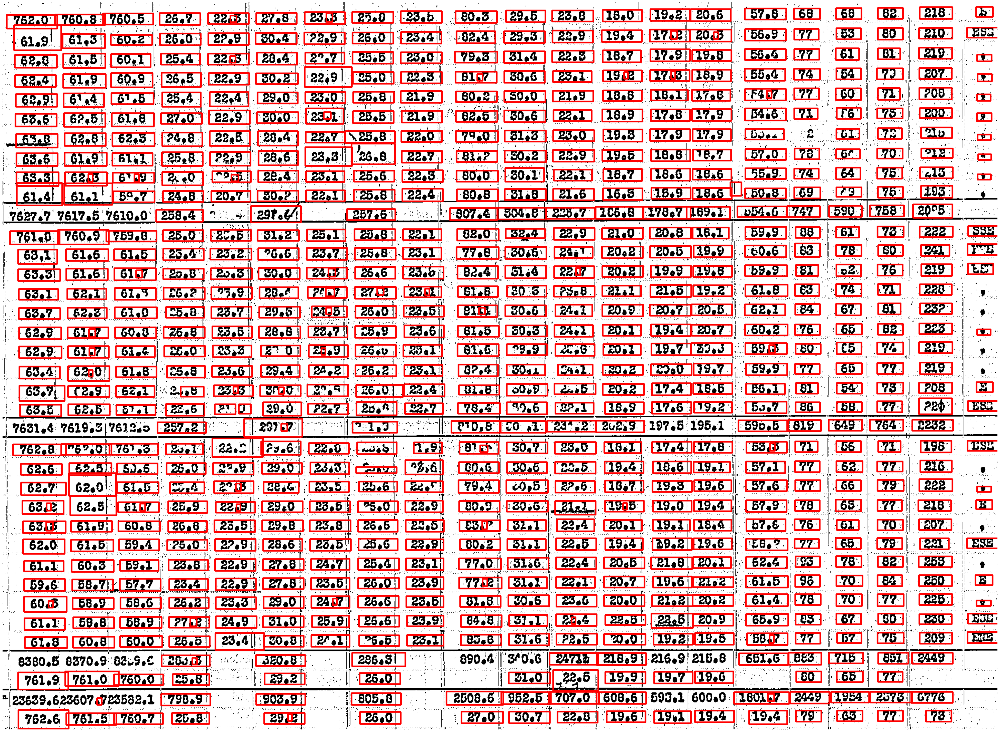

In [40]:
from src.table_and_cell_detection_model import filter_contours
# min_cell_width_threshold=int(config['TableAndCellDetection']['min_cell_width_threshold'])
# max_cell_width_threshold=int(config['TableAndCellDetection']['max_cell_width_threshold'])
# min_cell_height_threshold=int(config['TableAndCellDetection']['min_cell_height_threshold'])
# max_cell_height_threshold=int(config['TableAndCellDetection']['max_cell_height_threshold'])

## FOR VISUALIZATION PURPOSES. Uncomment the lines below to plot the identified cells (contours/bounding boxes)
# Make a copy of the original image to overlay contours without modifying the original
table_img_bin_overlayed_with_contours = table_img_bin.copy()
# Convert the grayscale image to RGB to support colored bounding boxes
table_img_bin_overlayed_with_contours = cv2.cvtColor(table_img_bin_overlayed_with_contours, cv2.COLOR_GRAY2RGB)

# Filter out smaller or larger bounding boxes from all the detected text contours. This is helpful to avoid overly large cells or small cells with no text. Remember to adjust these values based on the table structure in your specific case 
filtered_contours = filter_contours(contours, min_cell_width_threshold, min_cell_height_threshold, max_cell_width_threshold, max_cell_height_threshold)

logger.debug('Iterate over each contour in the new_contours list and draw bounding boxes')
for contour in filtered_contours:
    if contour is not None and len(contour) > 0:
        x, y, w, h = cv2.boundingRect(contour)

        # # Adjust bounding box dimensions
        # increase_factor_width = 0.05
        # increase_factor_height = 0.25
        # x += int(w * increase_factor_width) # Increase width
        # y -= int(h * increase_factor_height) # Increase height
        # w -= int(w * increase_factor_width) # Decrease width a little to avoid vertical lines that may be transcribed as the number 1 yet they aren't a number
        # h += int(h * increase_factor_height * 2) # Increase height

        # Define increase factors for bounding box modification
        increase_factor_width = 0.20  # Increase width by 20%
        increase_factor_height = 0.3  # Increase height by 25%

        # Expand width while keeping it centered
        new_w = int(w * (1 + increase_factor_width))  # Increase width
        x = max(0, x - (new_w - w) // 2)  # Adjust x to keep center fixed

        # Expand height symmetrically
        new_h = int(h * (1 + increase_factor_height * 2))  # Increase height
        y = max(0, y - (new_h - h) // 2)  # Adjust y to keep center fixed

        # Ensure bounding box remains within valid image bounds
        x = max(0, x)
        y = max(0, y)
        w = max(1, new_w)  # Avoid zero or negative width
        h = max(1, new_h)  # Avoid zero or negative height
        
        # Draw the bounding box directly on the overlay image
        cv2.rectangle(table_img_bin_overlayed_with_contours, (x, y), (x + w, y + h), (255, 0, 0), 3)


# Sort contours by y-coordinate
contours_sorted = sorted(filtered_contours, key=lambda c: cv2.boundingRect(c)[1])


## STEP 6: REMOVE ANY NOISE (SUCH AS DOTS) FROM THE BINARIZED IMAGE OF THE TABLE TO PREPARE IT FOR THE NEXT TRANSCRIPTION MODULE
# Apply the same dot removal to the **binarized image**
table_img_bin[dots_to_remove == 255] = 255  # Set dots to white

# Ensure the image is strictly binary
table_img_bin[table_img_bin > 127] = 255  # Set everything above 127 to white
table_img_bin[table_img_bin <= 127] = 0   # Set everything below 127 to black

table_for_overlaying_with_contours = table_img_bin.copy()
# Convert the grayscale image to RGB to support colored bounding boxes
table_for_overlaying_with_contours = cv2.cvtColor(table_for_overlaying_with_contours, cv2.COLOR_GRAY2RGB)
detected_table_cells = [contours_sorted, image_with_all_bounding_boxes, table_for_overlaying_with_contours, table_original_image, full_detected_table_with_labels]


# # Display the image with bounding boxes using matplotlib
plt.figure(figsize=(50, 50))
plt.imshow(table_img_bin_overlayed_with_contours)
plt.axis('off')  # Hide axis
plt.show()

In [41]:
max_rows = 33
month_filename = file_path.split('/')[-1]
print(month_filename)

curacao_1941_0116.jpg


In [42]:
def add_missing_boxes(sorted_rows, max_cell_width_threshold=130, max_cell_height_threshold=50, max_columns=24):
    updated_rows = []

    for row in sorted_rows:
        if any(cell is None for cell in row):
            continue

        bounding_boxes = [cv2.boundingRect(c) for c in row]
        bounding_boxes.sort(key=lambda b: b[0])

        new_boxes = bounding_boxes.copy()
        gaps = []

        # Handle missing boxes at the start of the row
        if new_boxes and new_boxes[0][0] > max_cell_width_threshold:
            first_x, first_y, first_w, first_h = new_boxes[0]
            num_missing_boxes = min(int(first_x // max_cell_width_threshold), max_columns - len(new_boxes))

            new_boxes_at_start = []
            for i in range(num_missing_boxes):
                new_x = max(0, first_x - (num_missing_boxes - i) * max_cell_width_threshold)
                new_box = (new_x, first_y, max_cell_width_threshold, max_cell_height_threshold)
                new_boxes_at_start.append(new_box)

            new_boxes = new_boxes_at_start + new_boxes

        for i in range(len(new_boxes) - 1):
            x1, y1, w1, h1 = new_boxes[i]
            x2, _, _, _ = new_boxes[i + 1]
            gap = x2 - (x1 + w1)

            if gap > max_cell_width_threshold:
                gaps.append((gap, i, x1 + w1, y1))

        gaps.sort(reverse=True, key=lambda g: g[0])

        for gap, i, gap_start_x, y1 in gaps:
            if len(new_boxes) >= max_columns:
                break

            num_missing_boxes = min(int(gap // max_cell_width_threshold), max_columns - len(new_boxes))

            total_box_width = num_missing_boxes * max_cell_width_threshold
            # start_x = gap_start_x + (gap - total_box_width) / 2

            # new_boxes_in_gap = []
            # for j in range(num_missing_boxes):
            #     new_x = start_x + j * max_cell_width_threshold
            #     new_box = (int(new_x), y1, max_cell_width_threshold, max_cell_height_threshold)
            #     new_boxes_in_gap.append(new_box)
            
            # Dynamically compute width so that all boxes fit perfectly into the gap
            dynamic_cell_width = gap / (num_missing_boxes + 1)

            new_boxes_in_gap = []
            for j in range(num_missing_boxes):
                if len(new_boxes) + len(new_boxes_in_gap) >= max_columns:
                    break

                center_x = gap_start_x + (j + 1) * dynamic_cell_width
                new_x = int(center_x - dynamic_cell_width / 2)

                new_box = (new_x, y1, int(dynamic_cell_width), max_cell_height_threshold)
                new_boxes_in_gap.append(new_box)
            
                # if len(new_boxes) + len(new_boxes_in_gap) >= max_columns:
                #     break

            new_boxes[i + 1:i + 1] = new_boxes_in_gap

        new_boxes = new_boxes[:max_columns]

        updated_contours = [
            np.array([[x, y], [x + w, y], [x + w, y + h], [x, y + h]], dtype=np.int32)
            for x, y, w, h in new_boxes
        ]
        updated_rows.append(updated_contours)

    return updated_rows

In [43]:
max_columns = 21

In [22]:
from src.transcription import organize_contours_midpoint, organize_contours_top, get_max_rows_from_filename#, add_missing_boxes, 
from src.transcription import generate_random_colors, draw_row_markers_and_boxes, calculate_trimmed_mean
from openpyxl import Workbook

# Contours of bounding boxes detected in cell recognition
new_contours = detected_table_cells[0]

image_with_all_bounding_boxes = detected_table_cells[1]
table_copy = detected_table_cells[2] # Binarized table image using Adaptive Thresholding
# table_copy = detected_table_cells[3] # Table image but as a clip of the original image (No Binarization)

# Get the dimensions of the loaded image. Here, particulary the image/table width is very important for the column placement of cells/bounding boxes
image_height, image_width, image_channels = image_with_all_bounding_boxes.shape

# Image onto which the regions of interest (ROIs) i.e the cells, will be drawn for illustration purposes
ROIs_image = table_copy.copy()

results = []

# Here we use two methods to arrange the boundung boxes (as a double check): (1) Using the middle coordinates of the bounding boxes , and (2) Using the top coordinated of the boudning boxes.
organize_methods = {  
    'Midpoint': organize_contours_midpoint,
    'Top': organize_contours_top
}

# organize_methods = {  
#         'Midpoint': organize_contours_by_column,
#         'Top': organize_contours_by_column
#     }

for method_name, organize_method in organize_methods.items():

    ## Create an Excel workbook and add a worksheet where the transcribed text will be saved
    wb = Workbook()
    ws = wb.active
    ws.title = 'OCR_Results'

    # Organize the contours
    # organized_rows = organize_method(new_contours, no_of_rows)

    organized_rows = organize_method(new_contours, month_filename, max_rows)
    # organized_rows = organize_method(new_contours, max_rows=43, row_threshold=50)

    # Sorting the cell (bounding box) rows from first to last using trimmed mean of coordinates
    sorted_rows = sorted(organized_rows, key=lambda row: calculate_trimmed_mean([cv2.boundingRect(c)[1] + cv2.boundingRect(c)[3] // 2 for c in row]))

    # Get the expected max rows (dynamically)
    # max_rows = get_max_rows_from_filename(month_filename)

    # Calculate how many rows need to be padded
    # missing_rows = 43 - max_rows  # Always ensuring 43 rows
    missing_rows = max_rows - len(sorted_rows)  # Calculate how many rows are missing to reach the maximum number of rows

    # If there are missing rows, pad `None` before the last two rows (totals & averages)
    if missing_rows > 0:
        # Ensure we don't disturb the last two rows
        sorted_rows = sorted_rows[:-2] + [[None]] * missing_rows + sorted_rows[-2:]

    sorted_rows = add_missing_boxes(sorted_rows, max_cell_width_threshold*0.9, max_cell_height_threshold*0.9)  # Add missing boxes per row where there are gaps

    ## FOR ILLUSTRATION PURPOSES: Uncomment the following lines if you want to see an example of how the sorting function works. This is for illustration purposes only and not necessary for the main functionality of the script. 
    
    # Create a copy of the image for visualization
    image_before_sorting = table_copy.copy()
    image_after_sorting = table_copy.copy()

    # Generate colors for 43 rows. For sorted row visualitation purposes
    colors = generate_random_colors(max_rows)  # Random colours for the maximum number of rows, such that each row has its own color for easy identification

    # Draw markers on the image before sorting
    draw_row_markers_and_boxes(image_before_sorting, organized_rows, colors)  # Green color for original order

    # Draw markers on the image after sorting
    draw_row_markers_and_boxes(image_after_sorting, sorted_rows, colors)  # Red color for sorted order

    # Ensure save directory exists
    save_dir = os.path.join(transient_transcription_output_dir, station)
    os.makedirs(save_dir, exist_ok=True)

    # # # Save or display the images for inspection
    print(method_name)
    # plt.imshow(image_before_sorting)
    # plt.show()
    # cv2.namedWindow(f'{method_name} before sorting', cv2.WINDOW_KEEPRATIO)
    # cv2.imshow(f'{method_name} before sorting', image_before_sorting)
    # cv2.resizeWindow(f'{method_name} before sorting', 1080, 720)
    # cv2.waitKey()
    # cv2.destroyAllWindows()

    # # plt.imshow(image_after_sorting)
    # # plt.show()
    # cv2.namedWindow(f'{method_name} after sorting', cv2.WINDOW_KEEPRATIO)
    # cv2.imshow(f'{method_name} after sorting', image_after_sorting)
    # cv2.resizeWindow(f'{method_name} after sorting', 1080, 720)
    # cv2.waitKey()
    # cv2.destroyAllWindows()

Midpoint
Top


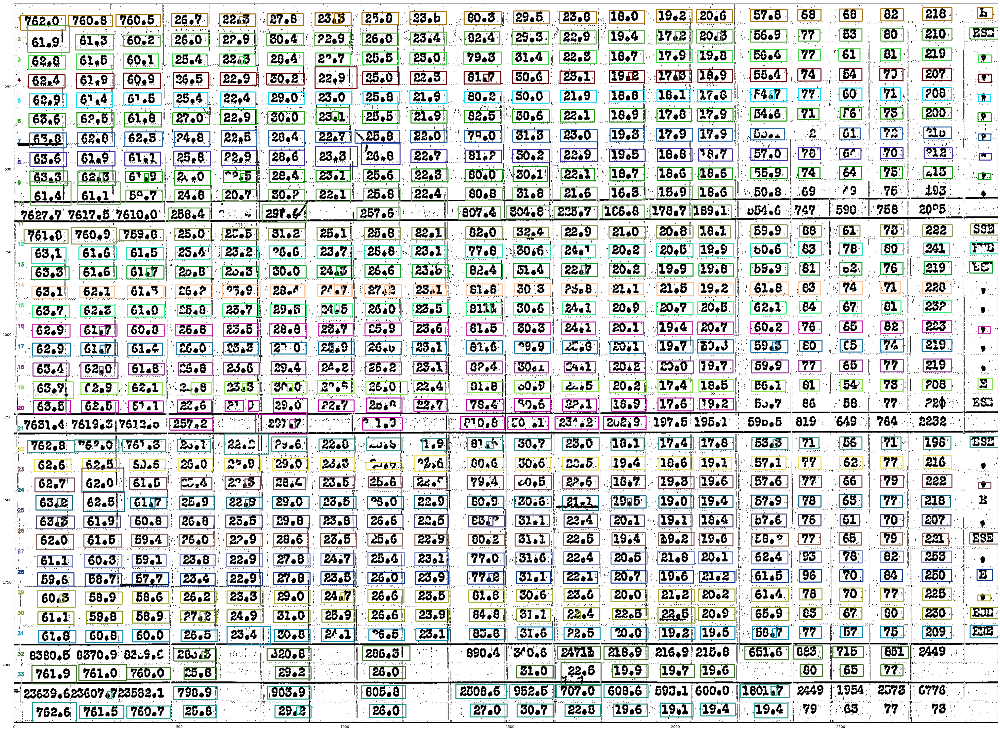

In [23]:
plt.figure(figsize=(50,50))
plt.imshow(image_after_sorting)

In [123]:
cv2.namedWindow(f'{method_name} after sorting', cv2.WINDOW_KEEPRATIO)
cv2.imshow(f'{method_name} after sorting', image_after_sorting)
cv2.resizeWindow(f'{method_name} after sorting', 2000, 1080)
cv2.waitKey()
cv2.destroyAllWindows()